<a href="https://colab.research.google.com/github/garrettdevereux/DeepLearningGenerativeArt/blob/main/MonetGANV1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# University of Washington CSE 493G1 Final Project: MonetGAN - Generative Art
## Garrett Devereux, Deekshita S Doli, and Begoña García Malaxechebarría

This notebook serves as a baseline for our Generative Art project utilizing the [Kaggle I'm Something of a Painter Myself](https://www.kaggle.com/competitions/gan-getting-started/data) dataset. Here, we attempt to create a simple CycleGAN and seek to achieve non-trivial results. Through this process, we will become more comfortable coding, training, and tuning our GAN with initial results we can work to improve in the coming weeks.


This notebook is heavily inspired from a variety of different references:

*   The Kaggle suggested [CycleGAN Tutorial Notebook](https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook) using the UNET architecture
*   [PyTorch Lightning Notebook](https://www.kaggle.com/code/chongzhenjie/photo-to-monet-cyclegan-pytorch-lightning/notebook) that introduces the implementation and benefits of training with PyTorch Lightning. 
* [PyTorch Lightning Basic GAN Tutorial](https://lightning.ai/docs/pytorch/stable/notebooks/lightning_examples/basic-gan.html#PyTorch-Lightning-Basic-GAN-Tutorial)
* [Original CycleGAN paper](https://arxiv.org/abs/1703.10593)


## Import Necessary Libraries

Ensure PyTorch Lightning is installed along all necessary libraries

In [58]:
!pip install pytorch_lightning==1.9.3;

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [59]:
import glob
import os
import shutil

import matplotlib.pyplot as plt
import numpy as np
import pytorch_lightning as L
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision.io import read_image
from torchvision.utils import make_grid, save_image

# os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


## Download Dataset and Connect Drive

Connect to Google Drive to load dataset. Note that the dataset being used is available [here](https://www.kaggle.com/competitions/gan-getting-started/data). This project was built inside a Google Drive folder named 'Code' with the datset located in the subdirectory 'Code/Dataset/gan-getting-started'. If you have downloaded this from the Github Repo, you will have to change the file paths below to reflect the new file structure.

In [60]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Store the current directory as 'Code' so we can refer to future files as if we are already in the directory. Update checkpoints to the directory where we will store and save all of the trained models.

In [61]:
os.chdir("/content/drive/MyDrive/Code")
checkpoints = "/content/drive/MyDrive/Code/checkpoints/"

If correctly mounted, should see 'MonetGANV1.ipynb', 'Dataset' and others in the current directory.

In [62]:
!ls;

Bego_PyTorch_MonetGAN.ipynb  Dataset	       results
checkpoints		     MonetGANV1.ipynb  TF-monet-cyclegan-tutorial.ipynb


## Load and Preprocess the Data

As this is the baseline example, we won't worry about Data Augmentation or any advanced preprocessing techniques. Instead we will just focus on setting up the Dataset and Dataloaders as seen in [PyTorch Tutorial from Recitation](https://courses.cs.washington.edu/courses/cse493g1/23sp/schedule/lectures/recitation4.pdf) and try to Visualize the Dataset 

### Storing The Dataset

In order to load and store the Dataset, we need to define a ```CustomImageDataset``` class that implements three functions:


*   **```__init__```**: store any internal values that may be of use
*   **```__len__```**: get the size of the dataset
*   **```__getitem__```**: get the i'th image in the dataset

Different instances of this class will be used to store the Photos and the Monet Paintings separately





In [63]:
class CustomImageDataset(Dataset):
    def __init__(self, filenames, stage):
        self.filenames = filenames
        # Stage of the current dataset (fit, test, predict)
        self.stage = stage
        
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = self.filenames[idx]
        img = read_image(img_name) / 255.0
        return img

### DataLoaders

We now prepare the Dataset by separately loading them into DataLoaders. As we are going to use PyTorch Lightning for the training process, we will handle all of this in a Custom LightningDataModule. See the [PyTorch Documentation](https://lightning.ai/docs/pytorch/stable/data/datamodule.html) for more details.

In [64]:
class CustomDataModule(L.LightningDataModule):
    def __init__(
        self,
        monet_dir,
        photo_dir, 
        loader_config,
        sample_size,
        batch_size,
    ):
        super().__init__()
        self.loader_config = loader_config
        self.sample_size = sample_size
        self.batch_size = batch_size       
            
        # Store File Paths to both the monet paintings, and regular photos
        self.monet_filenames = sorted(glob.glob(monet_dir))
        self.photo_filenames = sorted(glob.glob(photo_dir))
        
    def setup(self, stage):
        if stage == "fit":
            self.train_monet = CustomImageDataset(self.monet_filenames, stage)
            self.train_photo = CustomImageDataset(self.photo_filenames, stage)
            
        if stage in ["fit", "test", "predict"]:
            # to be used for test and prediction datasets as well
            self.valid_photo = CustomImageDataset(self.photo_filenames, None)

    def train_dataloader(self):
        loader_config = {
            "shuffle": True,
            "drop_last": True,
            "batch_size": self.batch_size,
            **self.loader_config,
        }
        loader_monet = DataLoader(self.train_monet, **loader_config)
        loader_photo = DataLoader(self.train_photo, **loader_config)
        loaders = {"monet": loader_monet, "photo": loader_photo}
        return loaders
    
    def val_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.sample_size,
            **self.loader_config,
        )
    
    def test_dataloader(self):
        return self.val_dataloader()
    
    def predict_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.batch_size,
            **self.loader_config,
        )

Configuration to be used in the Custom Data Module

In [65]:
DM_CONFIG = {    
    # the directories where the Monet paintings and photos are loaded from
    "monet_dir": os.path.join("./Dataset/gan-getting-started/monet_jpg", "*.jpg"),
    "photo_dir": os.path.join("./Dataset/gan-getting-started/photo_jpg", "*.jpg"),
    
    "loader_config": {
        # the number of subprocesses (excluding the main process) used for data loading
        "num_workers": os.cpu_count(),
        
        # enable faster data transfer to GPU during training
        "pin_memory": torch.cuda.is_available(),
    },
    
    # the validation/test batch size (mainly for visualization purposes)
    "sample_size": 5,
    
    # the training/prediction batch size
    "batch_size": 1
}

## Understanding the Dataset

Instantiate and Setup the CustomDataModule, then call train_dataloader() to get monet and photos dataloaders. Here we can see that with a batch size of 5, we have 60x5= 300 Monet Paintings and 1407x5 = 7028 photos. Additional, we can see that our batches of photos are shape 5 x 3 x 256 x 256 where we have 5 photos, 3 channels per photo of size 256 x 256

In [66]:
dm_sample = CustomDataModule(batch_size=5, **{k: v for k, v in DM_CONFIG.items() if k != "batch_size"})
dm_sample.setup("fit")

# Train_loader returns two loaders, one under 'monet' and another under 'photos
train_loader = dm_sample.train_dataloader()

monet_ds = train_loader["monet"]
photo_ds = train_loader["photo"]

# Lengths of the Dataset
print(len(monet_ds))
print(len(photo_ds))

# Get a batch of 5 photos from each Dataloader
example_monet = next(iter(monet_ds))
example_photo = next(iter(photo_ds))

print(example_monet.shape)
print(example_photo.shape)

60
1407
torch.Size([5, 3, 256, 256])
torch.Size([5, 3, 256, 256])


## Visualizing the Dataset

Here is an example of images from the Dataset, both Monet Paintings and Phots

In [67]:
def show_img(img_tensor, nrow, title=""):
    img_tensor = img_tensor.detach().cpu()
    img_grid = make_grid(img_tensor, nrow=nrow).permute(1, 2, 0)
    plt.figure(figsize=(18, 8))
    plt.imshow(img_grid)
    plt.axis("off")
    plt.title(title)
    plt.show()

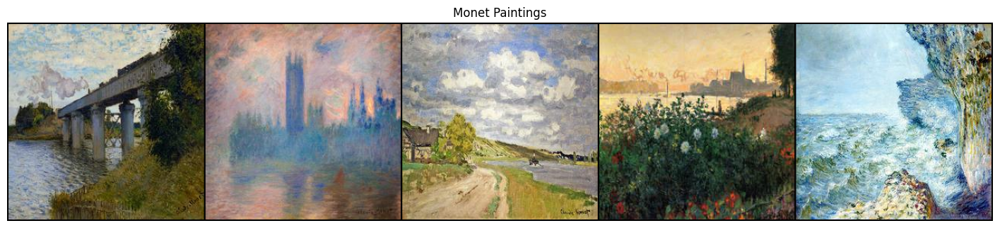

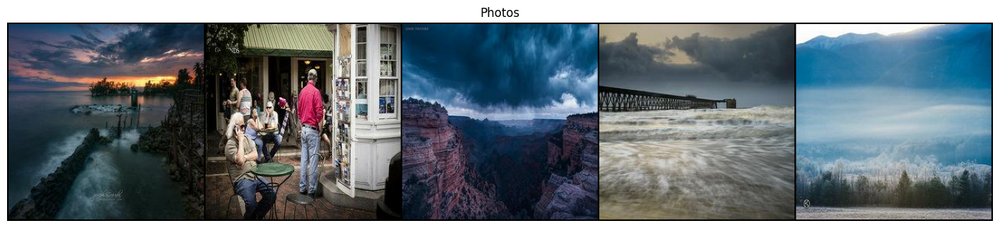

In [68]:
show_img(example_monet, nrow=5, title="Monet Paintings")
show_img(example_photo, nrow=5, title="Photos")

# Build the Generator

[Generator In a CycleGAN](https://machinelearningmastery.com/what-is-cyclegan/):

The GAN architecture is an approach to training a model for image synthesis that is comprised of two models: a generator model and a discriminator model. The generator takes a point from a latent space as input and generates new plausible images from the domain, and the discriminator takes an image as input and predicts whether it is real (from a dataset) or fake (generated). Both models are trained in a game, such that the generator is updated to better fool the discriminator and the discriminator is updated to better detect generated images.

The CycleGAN is an extension of the GAN architecture that involves the simultaneous training of two generator models and two discriminator models.

One generator takes images from the first domain as input and outputs images for the second domain, and the other generator takes images from the second domain as input and generates images for the first domain. Discriminator models are then used to determine how plausible the generated images are and update the generator models accordingly.


From the Tutorial Notebook:

We'll be using a UNET architecture for our CycleGAN. To build our generator, let's first define our downsample and upsample methods.

The downsample, as the name suggests, reduces the 2D dimensions, the width and height, of the image by the stride. The stride is the length of the step the filter takes. Since the stride is 2, the filter is applied to every other pixel, hence reducing the weight and height by 2.

We'll be using an instance normalization instead of batch normalization."

UNET - Architecture

![image.png](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)


In [69]:
class Downsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        norm=True,
        lrelu=True,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=kernel_size, stride=stride, padding=padding, bias=not norm),
        )
        if norm:
            self.block.append(nn.InstanceNorm2d(out_channels, affine=True))
        if lrelu is not None:
            self.block.append(nn.LeakyReLU(0.2, True) if lrelu else nn.ReLU(True))
        
    def forward(self, x):
        return self.block(x)

In [70]:
class Upsampling(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=4,
        stride=2,
        padding=1,
        output_padding=0,
        dropout=False,
    ):
        super().__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels,
                               kernel_size=kernel_size, stride=stride, 
                               padding=padding, output_padding=output_padding, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True),
        )
        if dropout:
            self.block.append(nn.Dropout(0.5))
        self.block.append(nn.ReLU(True))
        
    def forward(self, x):
        return self.block(x)

Let's build our generator!

The generator first downsamples the input image and then upsample while establishing long skip connections, giving it the U-shaped architecture. Skip connections are a way to help bypass the vanishing gradient problem by concatenating the output of a layer to multiple layers instead of only one. Here we concatenate the output of the downsample layer to the upsample layer in a symmetrical fashion, 

In [71]:
class UNetGenerator(nn.Module):
    def __init__(self, hid_channels, in_channels, out_channels):
        super().__init__()
        self.downsampling_path = nn.Sequential(
            Downsampling(in_channels, hid_channels, norm=False), # 64x128x128
            Downsampling(hid_channels, hid_channels*2), # 128x64x64
            Downsampling(hid_channels*2, hid_channels*4), # 256x32x32
            Downsampling(hid_channels*4, hid_channels*8), # 512x16x16
            Downsampling(hid_channels*8, hid_channels*8), # 512x8x8
            Downsampling(hid_channels*8, hid_channels*8), # 512x4x4
            Downsampling(hid_channels*8, hid_channels*8), # 512x2x2
            Downsampling(hid_channels*8, hid_channels*8, norm=False), # 512x1x1, instance norm does not work on 1x1
        )
        self.upsampling_path = nn.Sequential(
            Upsampling(hid_channels*8, hid_channels*8, dropout=True), # (512+512)x2x2
            Upsampling(hid_channels*16, hid_channels*8, dropout=True), # (512+512)x4x4
            Upsampling(hid_channels*16, hid_channels*8, dropout=True), # (512+512)x8x8
            Upsampling(hid_channels*16, hid_channels*8), # (512+512)x16x16
            Upsampling(hid_channels*16, hid_channels*4), # (256+256)x32x32
            Upsampling(hid_channels*8, hid_channels*2), # (128+128)x64x64
            Upsampling(hid_channels*4, hid_channels), # (64+64)x128x128
        )
        self.feature_block = nn.Sequential(
            nn.ConvTranspose2d(hid_channels*2, out_channels,
                               kernel_size=4, stride=2, padding=1), # 3x256x256
            nn.Tanh(),
        )

       
    def forward(self, x):
        skips = []
        for down in self.downsampling_path:
            x = down(x)
            skips.append(x)
        skips = reversed(skips[:-1])

        for up, skip in zip(self.upsampling_path, skips):
            x = up(x)
            x = torch.cat([x, skip], dim=1)
        return self.feature_block(x)

# Build the discriminator

The discriminator takes in the input image and classifies it as real or fake (generated). Instead of outputing a single node, the discriminator outputs a smaller 2D image with higher pixel values indicating a real classification and lower values indicating a fake classification. Unlike conventional networks that output a single probability of the input image being real or fake, CycleGAN uses the PatchGAN discriminator that outputs a matrix of values. Intuitively, each value of the output matrix checks the corresponding portion of the input image. Values closer to 1 indicate real classification and values closer to 0 indicate fake classification.

In [72]:
class Discriminator(nn.Module):
    def __init__(self, hid_channels, in_channels=3):
        super().__init__()
        self.block = nn.Sequential(
            Downsampling(in_channels, hid_channels, norm=False), # 64x128x128
            Downsampling(hid_channels, hid_channels*2), # 128x64x64
            Downsampling(hid_channels*2, hid_channels*4), # 256x32x32
            Downsampling(hid_channels*4, hid_channels*8, stride=1), # 512x31x31
            nn.Conv2d(hid_channels*8, 1, kernel_size=4, padding=1), # 1x30x30
        )
        
    def forward(self, x):
        return self.block(x)

### Visualizing the Generators

Now we can initialize untrained Generators and Discriminators. Note that nothing has been trained yet, so the behavior is really random at this point

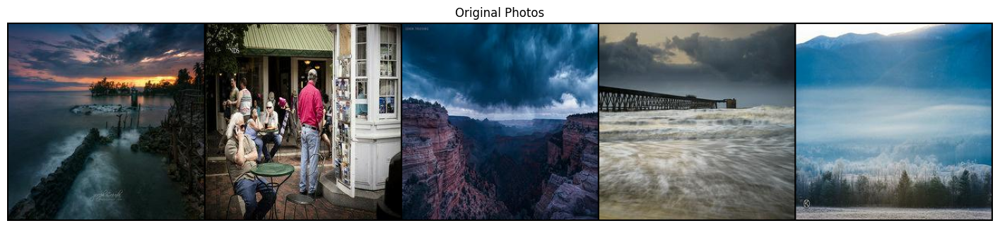

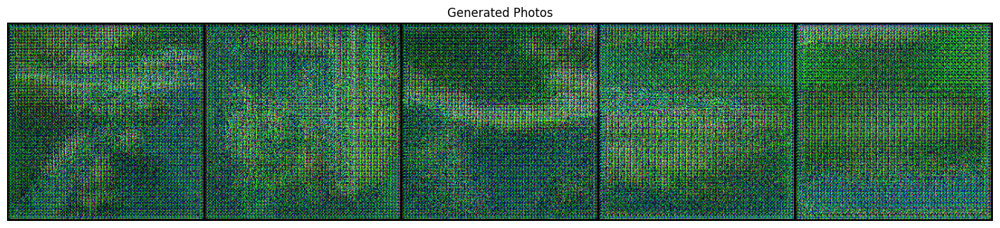

In [73]:
# Base Dimensions to use
hid_channels = 64
in_channels = 3
out_channels = 3

monet_generator = UNetGenerator(hid_channels, in_channels, out_channels) # transforms photos to Monet-esque paintings
photo_generator = UNetGenerator(hid_channels, in_channels, out_channels) # transforms Monet paintings to be more like photos

# Give a batch of example photos to the generator
to_monet = monet_generator(example_photo)

show_img(example_photo, nrow=5, title="Original Photos")
show_img(to_monet, nrow=5, title="Generated Photos")

## BUILD THE CycleGAN!

We now have our Generator and Discriminator and are ready to build the CylcleGAN. This will consist of two generators and two discriminators.

Outline More details here about generator and discriminator loss...



In [74]:
MODEL_PARAMS = {    
    # In channels and out channels
    "in_channels": 3,
    "out_channels": 3,

    # the number of filters in the first layer for the generators and discriminators
    "hid_channels": 64,
    
    # using Adam
    "optimizer": torch.optim.Adam,
    
    # the learning rate and beta parameters for the Adam optimizer
    "lr": 2e-4,
    "betas": (0.5, 0.999),
    
    # the weights used in the identity loss and cycle loss
    "lambda_idt": 0.5,
    "lambda_cycle": (10, 10), # (MPM direction, PMP direction)
    
    # the number of epochs for training
    "num_epochs": 10,
    
    # the number of epochs before starting the learning rate decay
    "decay_epochs": 8,
}

PyTorch Lightning Moduel, need more explanation here

In [75]:
class CycleGAN(L.LightningModule):
    def __init__(
        self,
        in_channels,
        out_channels,
        hid_channels,
        optimizer,
        lr,
        betas,
        lambda_idt,
        lambda_cycle,
        num_epochs,
        decay_epochs,
    ):
        super().__init__()
        self.save_hyperparameters(ignore=["optimizer"])
        self.optimizer = optimizer
        self.automatic_optimization = False
        
        # define generators and discriminators
        self.monet_generator = UNetGenerator(hid_channels, in_channels, out_channels) # transforms photos to Monet-esque paintings
        self.photo_generator = UNetGenerator(hid_channels, in_channels, out_channels) # transforms Monet paintings to be more like photos
        self.monet_discriminator = Discriminator(hid_channels) # differentiates real Monet paintings and generated Monet paintings
        self.photo_discriminator = Discriminator(hid_channels) # differentiates real photos and generated photos
        
    def forward(self, img):
        return self.monet_generator(img)   
            
    def init_weights(self):
        def init_fn(m):
            if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.InstanceNorm2d)):
                nn.init.normal_(m.weight, 0.0, 0.02)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0.0)
        
        for net in [self.monet_generator, self.photo_generator, self.monet_discriminator, self.photo_discriminator]:
            net.apply(init_fn)
        
    def setup(self, stage):
        if stage == "fit":
            self.init_weights()
            print("Model initialized.")
            
    def get_lr_scheduler(self, optimizer):
        def lr_lambda(epoch):
            len_decay_phase = self.hparams.num_epochs - self.hparams.decay_epochs + 1.0
            curr_decay_step = max(0, epoch - self.hparams.decay_epochs + 1.0)
            val = 1.0 - curr_decay_step / len_decay_phase
            return max(0.0, val)
        
        return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
    
    def configure_optimizers(self):
        opt_config = {
            "lr": self.hparams.lr,
            "betas": self.hparams.betas,
        }
        opt_gen = self.optimizer(
            list(self.monet_generator.parameters()) + list(self.photo_generator.parameters()),
            **opt_config,
        )
        opt_disc = self.optimizer(
            list(self.monet_discriminator.parameters()) + list(self.photo_discriminator.parameters()),
            **opt_config,
        )
        optimizers = [opt_gen, opt_disc]
        schedulers = [self.get_lr_scheduler(opt) for opt in optimizers]
        return optimizers, schedulers
        
    def adv_criterion(self, y_hat, y):
        return F.mse_loss(y_hat, y)
    
    def recon_criterion(self, y_hat, y):
        return F.l1_loss(y_hat, y)
    
    def get_adv_loss(self, fake, disc):
        fake_hat = disc(fake)
        real_labels = torch.ones_like(fake_hat)
        adv_loss = self.adv_criterion(fake_hat, real_labels)
        return adv_loss
    
    def get_idt_loss(self, real, idt, lambda_cycle):
        idt_loss = self.recon_criterion(idt, real)
        return self.hparams.lambda_idt * lambda_cycle * idt_loss
    
    def get_cycle_loss(self, real, recon, lambda_cycle):
        cycle_loss = self.recon_criterion(recon, real)
        return lambda_cycle * cycle_loss

    def get_gen_loss(self):
        # calculate adversarial loss
        adv_loss_PM = self.get_adv_loss(self.fake_M,  self.monet_discriminator)
        adv_loss_MP = self.get_adv_loss(self.fake_P, self.photo_discriminator)
        total_adv_loss = adv_loss_PM + adv_loss_MP
        
        # calculate identity loss
        lambda_cycle = self.hparams.lambda_cycle
        idt_loss_MM = self.get_idt_loss(self.real_M, self.idt_M, lambda_cycle[0])
        idt_loss_PP = self.get_idt_loss(self.real_P, self.idt_P, lambda_cycle[1])
        total_idt_loss = idt_loss_MM + idt_loss_PP
        
        # calculate cycle loss
        cycle_loss_MPM = self.get_cycle_loss(self.real_M, self.recon_M, lambda_cycle[0])
        cycle_loss_PMP = self.get_cycle_loss(self.real_P, self.recon_P, lambda_cycle[1])
        total_cycle_loss = cycle_loss_MPM + cycle_loss_PMP
        
        # combine losses
        gen_loss = total_adv_loss + total_idt_loss + total_cycle_loss
        return gen_loss
    
    def get_disc_loss(self, real, fake, disc):
        # calculate loss on real images
        real_hat = disc(real)
        real_labels = torch.ones_like(real_hat)
        real_loss = self.adv_criterion(real_hat, real_labels)
        
        # calculate loss on fake images
        fake_hat = disc(fake.detach())
        fake_labels = torch.zeros_like(fake_hat)
        fake_loss = self.adv_criterion(fake_hat, fake_labels)
        
        # combine losses
        disc_loss = (fake_loss + real_loss) * 0.5
        return disc_loss
    
    def training_step(self, batch, batch_idx):
        self.real_M = batch["monet"]
        self.real_P = batch["photo"]
        opt_gen, opt_disc = self.optimizers()

        # generate fake images
        self.fake_M = self.monet_generator(self.real_P)
        self.fake_P = self.photo_generator(self.real_M)
         
        # generate identity images
        self.idt_M = self.monet_generator(self.real_M)
        self.idt_P = self.photo_generator(self.real_P)
        
        # reconstruct images
        self.recon_M = self.monet_generator(self.fake_P)
        self.recon_P = self.photo_generator(self.fake_M)
    
        # train generators
        self.toggle_optimizer(opt_gen, 0)
        gen_loss = self.get_gen_loss()        
        opt_gen.zero_grad()
        self.manual_backward(gen_loss)
        opt_gen.step()
        self.untoggle_optimizer(0)
        
        # train discriminators
        self.toggle_optimizer(opt_disc, 1)
        disc_loss_M = self.get_disc_loss(self.real_M, self.fake_M,  self.monet_discriminator)
        disc_loss_P = self.get_disc_loss(self.real_P, self.fake_P, self.photo_discriminator)
        opt_disc.zero_grad()
        self.manual_backward(disc_loss_M)
        self.manual_backward(disc_loss_P)
        opt_disc.step()
        self.untoggle_optimizer(1)
        
        # record training losses
        metrics = {
            "gen_loss": gen_loss,
            "disc_loss_M": disc_loss_M,
            "disc_loss_P": disc_loss_P,
        }
        self.log_dict(metrics, on_step=False, on_epoch=True, prog_bar=True)
        
    def validation_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "validate")
    
    def test_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "test")
        
    def predict_step(self, batch, batch_idx):
        return self(batch)
    
    def display_results(self, batch, batch_idx, stage):
        real_P = batch
        fake_M = self(real_P)
        
        if stage == "validate":
            title = f"Epoch {self.current_epoch+1}: Photo-to-Monet Translation"
        else:
            title = f"Sample {batch_idx+1}: Photo-to-Monet Translation"

        show_img(
            torch.cat([real_P, fake_M], dim=0),
            nrow=len(real_P),
            title=title,
        )
    
    def on_train_epoch_start(self):
        # record learning rates
        curr_lr = self.lr_schedulers()[0].get_last_lr()[0]
        self.log("lr", curr_lr, on_step=False, on_epoch=True, prog_bar=True)
        
    def on_train_epoch_end(self):
        # update learning rates
        for sch in self.lr_schedulers():
            sch.step()
        
        # print current state of epoch
        logged_values = self.trainer.progress_bar_metrics
        print(
            f"Epoch {self.current_epoch+1}",
            *[f"{k}: {v:.5f}" for k, v in logged_values.items()],
            sep=" - ",
        )
        
    def on_train_end(self):
        print("Training ended.")
        
    def on_predict_epoch_end(self):
        predictions = self.trainer.predict_loop.predictions
        num_batches = len(predictions)
        batch_size = predictions[0].shape[0]
        last_batch_diff = batch_size - predictions[-1].shape[0]
        print(f"Number of images generated: {num_batches*batch_size-last_batch_diff}.")

## Training

We use PyTorch Lightning Training Object to do everything for us!
More doc needed

In [77]:
TRAIN_CONFIG = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    
    # train on 16-bit precision
    "precision": 16 if torch.cuda.is_available() else 32,
    
    # train on single GPU
    "devices": 1,
    
    # save checkpoint only for last epoch by default
    "enable_checkpointing": True,
    
    # disable logging for simplicity
    "logger": False,
    
    # the number of epochs for training (we limit the number of train/predict batches during debugging)
    "max_epochs": MODEL_PARAMS["num_epochs"],
    "limit_train_batches": 1.0,
    "limit_predict_batches": 1.0,
    
    # the maximum amount of time for training, in case we exceed run-time of 5 hours
    "max_time": {"hours": 11, "minutes": 55},
    
    # use a small subset of photos for validation/testing (we limit here for flexibility)
    "limit_val_batches": 1,
    "limit_test_batches": 5,
        
    # disable sanity check before starting the training routine
    "num_sanity_val_steps": 0,
    
    # the frequency to visualize the progress of adding Monet style
    "check_val_every_n_epoch": 2,
}

INFO:pytorch_lightning.utilities.rank_zero:Using 16bit None Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
INFO:pytorch_lightning.utilities.rank_zero:`Trainer(limit_val_batches=1)` was configured so 1 batch will be used.
INFO:pytorch_lightning.utilities.rank_zero:`Trainer(limit_predict_batches=1.0)` was configured so 100% of the batches will be used..
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                | Type          | Params
----------------

Model initialized.


Training: 0it [00:00, ?it/s]

Epoch 1 - lr: 0.00020 - gen_loss: 2.46165 - disc_loss_M: 0.21058 - disc_loss_P: 0.19596


Validation: 0it [00:00, ?it/s]

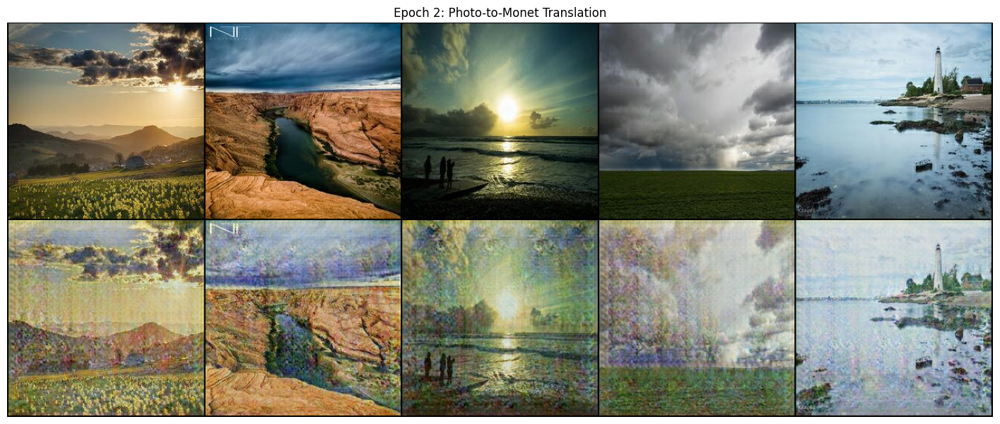

Epoch 2 - lr: 0.00020 - gen_loss: 1.92254 - disc_loss_M: 0.19978 - disc_loss_P: 0.19720
Epoch 3 - lr: 0.00020 - gen_loss: 1.96350 - disc_loss_M: 0.15317 - disc_loss_P: 0.18694


Validation: 0it [00:00, ?it/s]

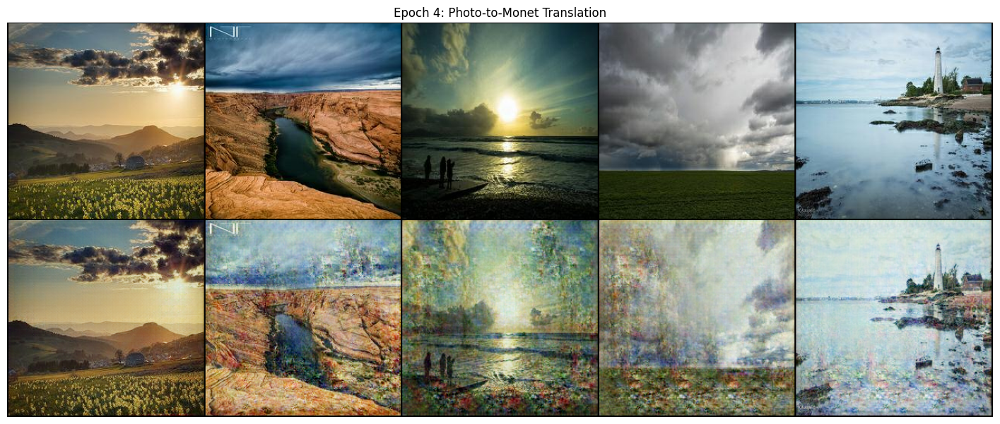

Epoch 4 - lr: 0.00020 - gen_loss: 2.01641 - disc_loss_M: 0.12190 - disc_loss_P: 0.18420
Epoch 5 - lr: 0.00020 - gen_loss: 2.07961 - disc_loss_M: 0.09074 - disc_loss_P: 0.18477


Validation: 0it [00:00, ?it/s]

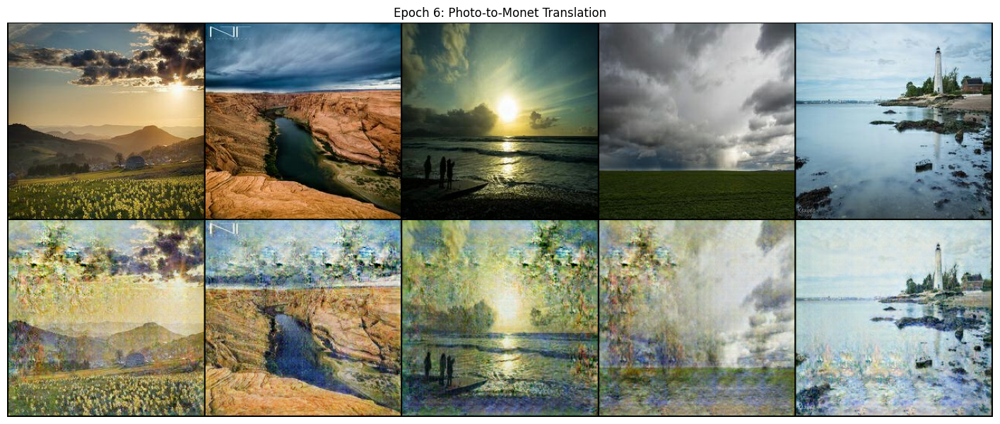

Epoch 6 - lr: 0.00020 - gen_loss: 2.10591 - disc_loss_M: 0.07910 - disc_loss_P: 0.18857
Epoch 7 - lr: 0.00020 - gen_loss: 2.09484 - disc_loss_M: 0.07693 - disc_loss_P: 0.19225


Validation: 0it [00:00, ?it/s]

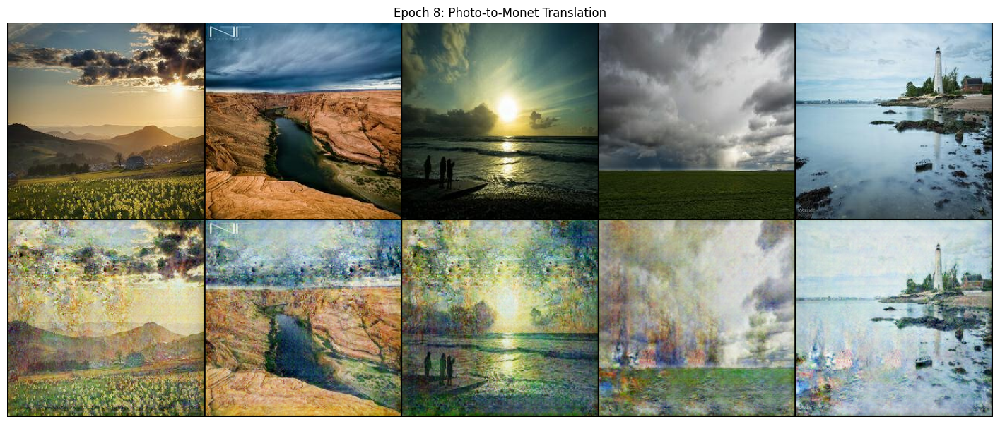

Epoch 8 - lr: 0.00020 - gen_loss: 2.11209 - disc_loss_M: 0.07190 - disc_loss_P: 0.19212
Epoch 9 - lr: 0.00013 - gen_loss: 2.13595 - disc_loss_M: 0.05165 - disc_loss_P: 0.19963


Validation: 0it [00:00, ?it/s]

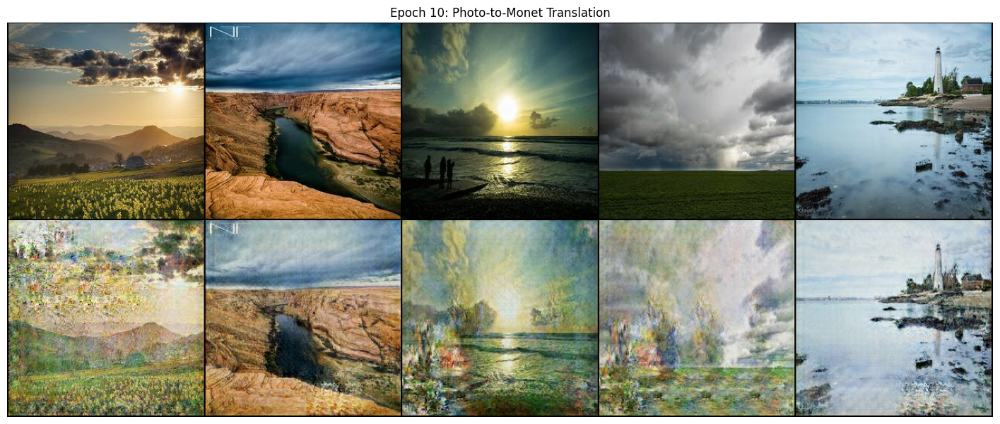

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10 - lr: 0.00007 - gen_loss: 2.13923 - disc_loss_M: 0.03607 - disc_loss_P: 0.21010
Training ended.


In [79]:
dm = CustomDataModule(**DM_CONFIG)
model = CycleGAN(**MODEL_PARAMS)
trainer = L.Trainer(**TRAIN_CONFIG)

trainer.fit(model, datamodule=dm)